In [1]:
#ensure cuda is working
import torch
assert torch.cuda.is_available()
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.current_device())
print(torch.cuda.device(0))
print(torch.cuda.get_device_name(0))

True
1
0
NVIDIA RTX A4500


In [2]:
import mira

import anndata
import scanpy as sc
import numpy as np
import pandas as pd
import scvelo as scv

import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 14})
import matplotlib
import matplotlib as mpl
from copy import copy
reds = copy(mpl.cm.Reds)
reds.set_under("lightgray")

import os
import sys
from pathlib import Path
os.environ['R_HOME'] = sys.exec_prefix+"/lib/R/"

project_directory = '/Cranio_Lab/Louk_Seton/4_species_project'
os.chdir(os.path.expanduser("~")+project_directory)

In [3]:
species = 'mouse' #specify the species
genome = 'mm10' #specify the genome

adata = sc.read('h5ad_files/'+species+'/'+genome+'/'+'adata_concat.h5ad')


In [4]:
with open('required_files/allTFs_mm.txt') as f:
    tf_list = [line.rstrip('\n') for line in f]
import numpy as np
adata.var['TF'] = np.where(adata.var.index.isin(tf_list),True,False)

In [5]:
adata = adata[:,adata.var['TF']==True].copy()

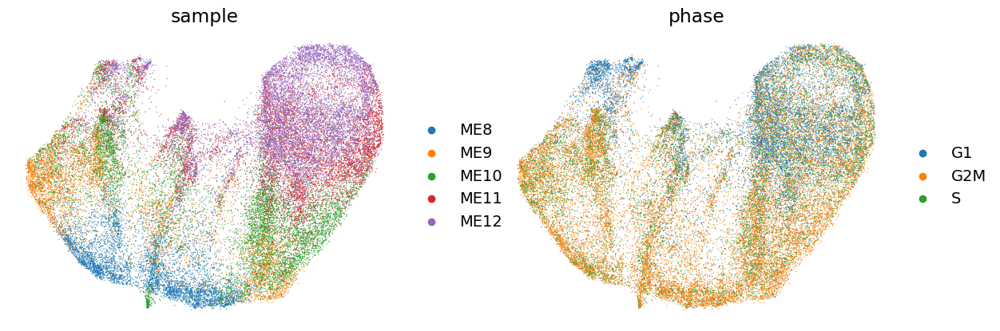

In [6]:
#sc.pp.filter_genes(adata, min_cells=15)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
#sc.pp.highly_variable_genes(adata, min_disp = 0.5)
sc.pp.highly_variable_genes(adata, min_disp = 0.5,batch_key='sample',
                            #n_top_genes=1000
                           )

sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=6)
sc.tl.umap(adata, min_dist = 0.2, negative_sample_rate=0.2)
sc.pl.umap(adata, color = ['sample','phase'], frameon=False)

In [7]:
adata.var['highly_variable'].value_counts()

highly_variable
False    1502
True      334
Name: count, dtype: int64

In [8]:
TF_highly_variable = list(adata.var[adata.var['highly_variable']==True].index)


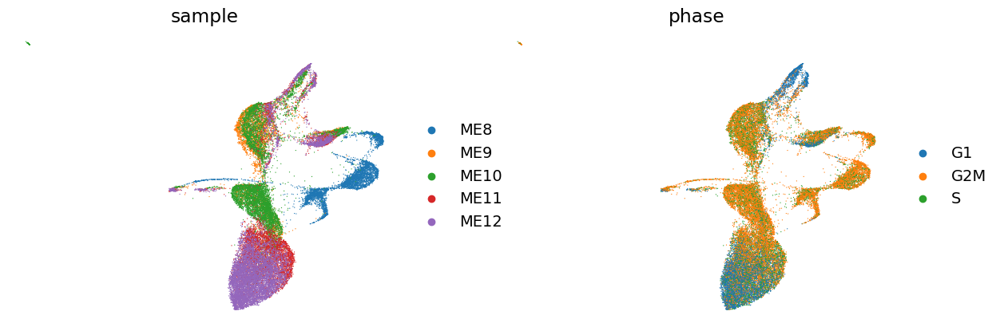

In [9]:
adata = sc.read('h5ad_files/'+species+'/'+genome+'/'+'adata_concat.h5ad')

with open('required_files/allTFs_mm.txt') as f:
    tf_list = [line.rstrip('\n') for line in f]
import numpy as np
adata.var['TF'] = np.where(adata.var.index.isin(tf_list),True,False)
adata = adata[:,adata.var['TF']==False].copy()
#sc.pp.filter_genes(adata, min_cells=15)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
#sc.pp.highly_variable_genes(adata, min_disp = 0.5)
sc.pp.highly_variable_genes(adata, min_disp = 0.5,batch_key='sample',
                            n_top_genes=500
                           )

sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=6)
sc.tl.umap(adata, min_dist = 0.2, negative_sample_rate=0.2)
sc.pl.umap(adata, color = ['sample','phase'], frameon=False)

rest_highly_variable = list(adata.var[adata.var['highly_variable']==True].index)


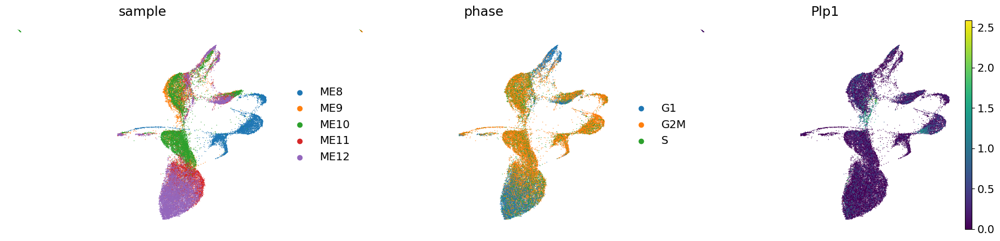

In [10]:
sc.pl.umap(adata, color = ['sample','phase','Plp1'], frameon=False)


In [ ]:
highly_variable_list = TF_highly_variable+rest_highly_variable
highly_variable_list

In [16]:
##mira stuff
model = mira.topics.make_model(
    adata.n_obs, adata.n_vars, # helps MIRA choose reasonable values for some hyperparameters which are not tuned.
    feature_type = 'expression',
    #highly_variable_key='TF',
    highly_variable_key = 'highly_variable_list',
    counts_layer='original_counts',
    categorical_covariates='batch',
    continuous_covariates= ['S_score','G2M_score'],
)

In [17]:
model.get_learning_rate_bounds(adata)

INFO:mira.adata_interface.topic_model:Predicting expression from genes from col: highly_variable_list


Gathering dataset statistics:   0%|          | 0/33371 [00:00<?, ?it/s]

Learning rate range test:   0%|          | 0/98 [00:00<?, ?it/s]

INFO:mira.topic_model.base:Set learning rates to: (0.00032941900574369297, 0.08813330408301295)


(0.00032941900574369297, 0.08813330408301295)

<Axes: xlabel='Learning Rate', ylabel='Loss'>

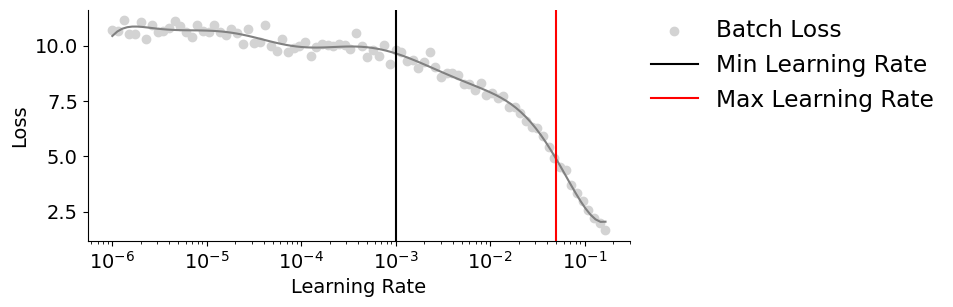

In [33]:
model.set_learning_rates(1e-3, 0.05) # for larger datasets, the default of 1e-3, 0.1 usually works well.
model.plot_learning_rate_bounds(figsize=(7,3))

In [19]:
topic_contributions = mira.topics.gradient_tune(model, adata)

Gathering dataset statistics:   0%|          | 0/33371 [00:00<?, ?it/s]

Epoch 0:   0%|          | 0/24 [00:00<?, ?it/s]

Predicting latent vars:   0%|          | 0/131 [00:00<?, ?it/s]

<Axes: xlabel='Topic Number', ylabel='Max contribution'>

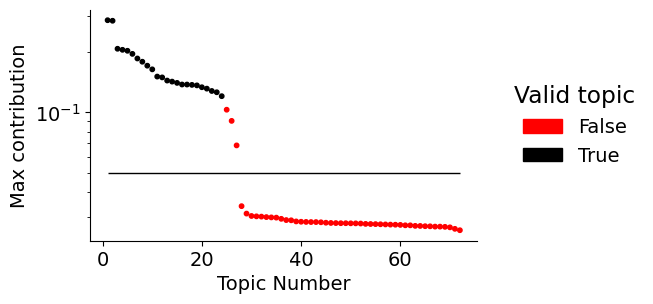

In [20]:
NUM_TOPICS = 24

mira.pl.plot_topic_contributions(topic_contributions, NUM_TOPICS)

In [34]:
NUM_TOPICS = 24
epoch = 31
model = model.set_params(num_topics = NUM_TOPICS,  num_epochs = epoch).fit(adata)

INFO:mira.adata_interface.topic_model:Predicting expression from genes from col: highly_variable_list


Gathering dataset statistics:   0%|          | 0/33371 [00:00<?, ?it/s]

Epoch 0:   0%|          | 0/31 [00:00<?, ?it/s]

INFO:mira.topic_model.base:Moving model to device: cpu


In [35]:
model.predict(adata, batch_size = 512)

Predicting latent vars:   0%|          | 0/66 [00:00<?, ?it/s]

INFO:mira.adata_interface.core:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18, topic_19, topic_20, topic_21, topic_22, topic_23
INFO:mira.adata_interface.core:Added key to varm: topic_feature_compositions
INFO:mira.adata_interface.core:Added key to varm: topic_feature_activations
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram


In [36]:
sc.pp.neighbors(adata, use_rep = 'X_umap_features', metric = 'manhattan',n_neighbors=15)
sc.tl.umap(adata, min_dist=0.1, negative_sample_rate=0.05,n_components =3)
#sc.tl.umap(adata, min_dist=0.3, negative_sample_rate=0.05,n_components =3)

adata.obsm['X_umap_tuned_3d_new'] = adata.obsm['X_umap']


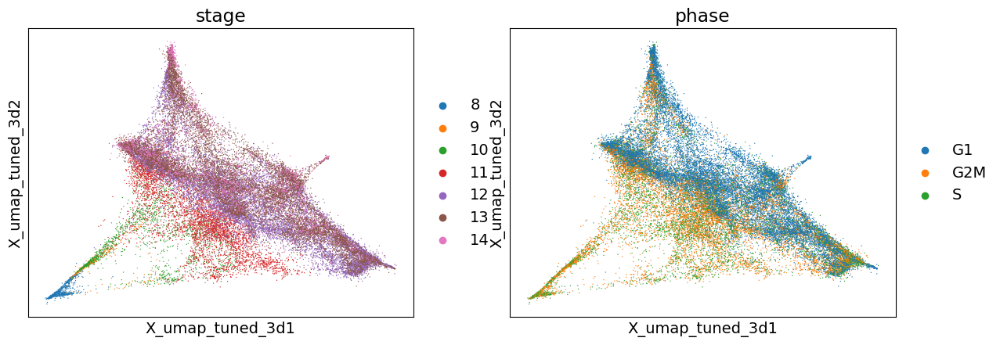

In [37]:
sc.pl.embedding(adata,
                    basis='X_umap_tuned_3d',
                    color = ['stage','phase',],
                    ncols=3, cmap=reds, vmin=0.3)

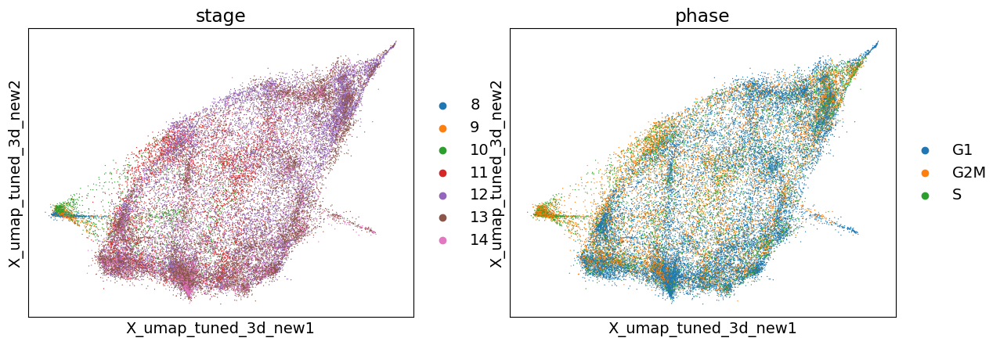

In [38]:
sc.pl.embedding(adata,
                    basis='X_umap_tuned_3d_new',
                    color = ['stage','phase',],
                #groups=['8'],
                    ncols=3, cmap=reds, vmin=0.3)

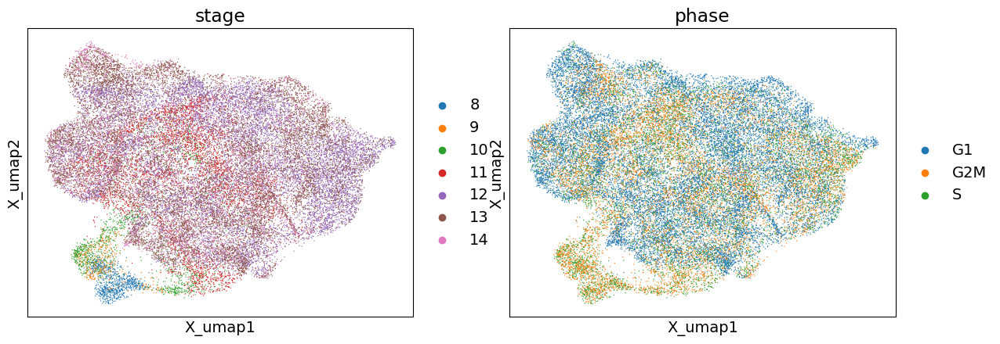

In [39]:
sc.tl.umap(adata)
sc.pl.embedding(adata,
                    basis='X_umap',
                    color = ['stage','phase',],
                    ncols=3, cmap=reds, vmin=0.3)

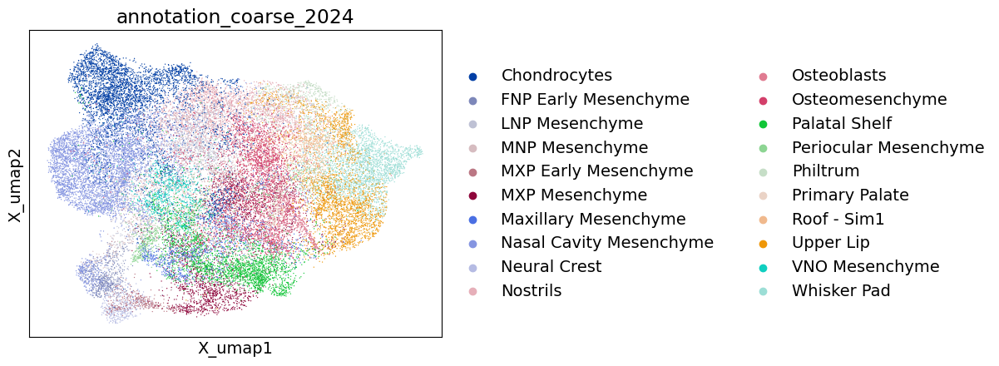

In [40]:
sc.pl.embedding(adata,
                    basis='X_umap',
                    color = ['annotation_coarse_2024',],
                    ncols=3, cmap=reds, vmin=0.3)

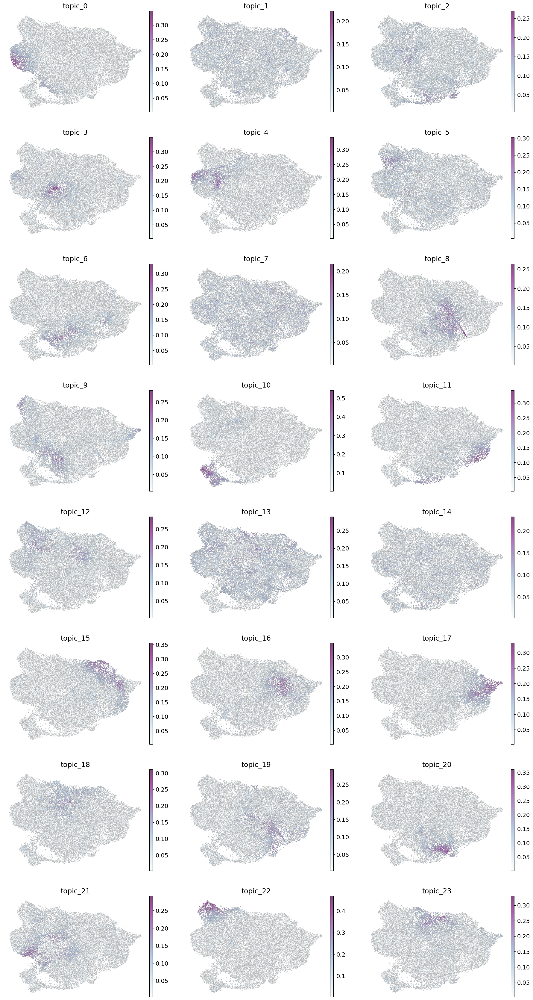

In [41]:
sc.pl.umap(adata, color = model.topic_cols, cmap='BuPu', ncols=3,
           add_outline=True, outline_width=(0.1,0), frameon=False)

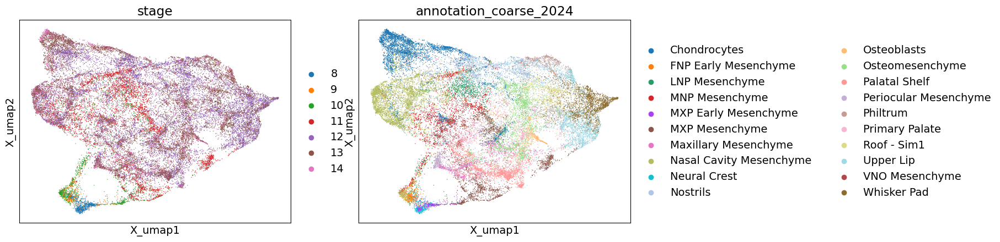

In [22]:
sc.tl.umap(adata, min_dist=0.1, negative_sample_rate=4, random_state=909)
sc.pl.embedding(adata,
                    basis='X_umap',
                    color = ['stage','annotation_coarse_2024',],
                    ncols=3, cmap=reds, vmin=0.3)